<a href="https://colab.research.google.com/github/yongan007/Inverse_kinematics_convex_optimisation/blob/main/Inverse_kinematics_convex_optimisation.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>



> Indented block

> Indented block

> Indented block







---

## **Optimal Inverse Kinematics**

---
Consider redundant serial manipulator:
<p><img alt="Remote manipulator" height="250" src="https://drive.google.com/uc?id=10m51EWG5_7sjUAZaIRYDkfPqmwxYCOxj" align="center" hspace="350px" vspace="0px"></p>


A problem is to find joint angles $\mathbf{q}$ (by means of integrating velocity $\dot{\mathbf{q}}$) that support linear motion from the given initial state defined by joint angles $\mathbf{q}_0$ (and respective solution $\boldsymbol{x}_0$ ) to the desired state $x_d$ and minimize the following cost on each $\mathbf{q}$:
\begin{equation}
\mathcal{J}_c = w_k\frac{1}{2}\dot{\mathbf{q}}^T \mathbf{D}(\mathbf{q})\dot{\mathbf{q}} + w_p\frac{\partial\mathbf{U}(\mathbf{q})}{\partial\mathbf{q}}^T\dot{\mathbf{q}}
\end{equation}
while respecting the constraints on the desired velocity: 
\begin{equation}
\mathbf{}\dot{\boldsymbol{x}} = \mathbf{J}(\mathbf{q})\dot{\mathbf{q}}
\end{equation}

$q_1,q_2,q_3,q_4$

where:
* $\boldsymbol{x} \in \mathbb{R}^m $ are task space coordinates.
* $\mathbf{q} \in \mathbb{R}^n$ a generilized coordinates ($n>m$).
* $\mathbf{D}(\mathbf{q}) \in \mathbb{R}^{n \times n}$ positive definite symmetric inertia matrix.  
* $\mathbf{U}(\mathbf{q})\in \mathbb{R}$ - potential function.
* $w_k, w_p$ - wieghting gains

For example, $U(\mathbf{q})$ could be the gravitational potential energy. 

---

>Do the following:
* Define optimization problem for this task in general case
* Find analytical solution of proposed problem
* Answer what gains $w_k, w_p$ are responsible for?
* Implement your solution and visualize it (plots and animation), compare it with pseudo-inverse solution ($\mathbf{D}(\mathbf{q}) = \mathbf{I}, \mathbf{U}(\mathbf{q})=0$) 
* Describe how would you modify algorithm given that joint velocities are bounded $\dot{\mathbf{q}}_{min}  \leq \dot{\mathbf{q}} \leq \dot{\mathbf{q}}_{max}$ 
* Modify your algorithm to tackle integration drift.

---

How would you modify your algorithm to tackle integration drift? Implement your modification. 


> **BONUS**:
Suppose now that there is obstacle between initial and desired point as shown on figure below. Modify your problem to tackle this case. 

<p><img alt="Remote manipulator" height="250" src="https://drive.google.com/uc?id=1Y8YsVqA8LSKaZHh5LpXvJMKxPC8G51yE" align="center" hspace="350px" vspace="0px"></p>



# Inverse Kinematics as Optimal Problems 

In the most case we can find inverse kinematics solution by calculate the the required joint velocities $\dot{\theta}$  directly from the relationship $J \dot{q} =\dot{x}$. 
\begin{equation}
\dot{q} =J^{\dagger}\dot{x}
\end{equation}We could get pseudo-inverse of joint velocities minimizing the two-norm $ \|\dot{q}\|$ 
 \begin{equation}
 min_{\dot{q}} \mathcal{J}_c = \dot{\mathbf{q}}^T\dot{\mathbf{q}} 
\end{equation}subject to $\dot{x} = J(q) \dot{q}$.

which the solution to this problem is $\dot{q} = J^T (JJ^T)^{-1}\dot{x}$ which is simply as $\dot{q} =  J^{\dagger}\dot{x} $ where$J^{\dagger} = J^T (JJ^T)^{-1}$.

From this solution we can see that the cost of each joint velocity is identically. So from here we should think also that in the real scenario the velocity at the first joint, which moves a lot of the robot’s mass, could be weighted more heavily than the velocity at the last joint, which moves little of the robot’s mass.
Thus we can generalize this problem of defining the joint velocities through minimizing the sum of the kinetic energy and the rate of change of the potential energy and define the cost function as following: 

\begin{equation}
 \underset{\dot{q}} {\text{min}}   \mathcal{J}_c = w_k\frac{1}{2}\dot{\mathbf{q}}^T \mathbf{D}(\mathbf{q})\dot{\mathbf{q}} + w_p\frac{\partial\mathbf{U}(\mathbf{q})}{\partial\mathbf{q}}^T\dot{\mathbf{q}}
\end{equation}
\begin{equation}
S.T \quad \mathbf{}\dot{\boldsymbol{x}} = \mathbf{J}(\mathbf{q})\dot{\mathbf{q}}
\end{equation}





>**gains** $w_k, w_p$ 

By do so, the robot are minimized a
configuration-dependent kinetics and potential energy function.

A robot system might require more kinematics energies rather than the gravitational potential energy the gravitational potential energy or wise-versa. The $w_k, w_p$ introduce are weighting gains to the energies function so that we can give different weighting to the cost function. 
In the experiment section we tried different values for the $\omega_k$ and $\omega_p$ and observed the effects. 

# Analytical solution

To get the analytical solution of this problem we can use  the Lagrangian Multiplier or Karush–Kuhn–Tucker conditions. The first-order necessary conditions for optimality: 
\begin{equation}
 \frac{\partial \mathcal{J}_c}{\partial \dot{q}} + \frac{\partial \dot{x}}{\partial \dot{q}}\lambda=0
\end{equation}
Taking the derivative of the cost function  $\mathcal{J}_c$  and $\dot{x}$ the following results are obtained:
\begin{equation}
    \omega_k \dot{q} D + J \lambda +\omega_p \delta_q u =0
\end{equation}Together with the constrain, we get:  
\begin{equation}
\begin{cases}
    \omega_k \dot{q} D + J \lambda = -\omega_p \delta_q u \\
  J(q) \dot{q} = \dot{x}
  \end{cases}
\end{equation}
\begin{equation}
    \begin{bmatrix}
          \omega_k D & J  \\
          J & 0
    \end{bmatrix} \begin{bmatrix}
          \dot{q}  \\ \lambda 
    \end{bmatrix} =     \begin{bmatrix}
    -\omega_p \delta{q}_u \\ \dot{x}
    \end{bmatrix}
\end{equation}
Since J is of maximal rank and D is invertible, the optimal $\dot{q}$ and $\lambda$ can be derived as follows:
\begin{equation}
\dot{q} = G \dot{x} + (I - GJ) (\omega_k D)^{-1} w_p\frac{\partial\mathbf{U}(\mathbf{q})}{\partial\mathbf{q}} \\
\lambda = B \dot{x} + B J(\omega_k D)^{-1} w_p\frac{\partial\mathbf{U}(\mathbf{q})}{\partial\mathbf{q}} 
\end{equation}

where  $G \in R^{n\times m}$ and   $G \in R^{m \times m}$  are defined as below:
\begin{equation}
    G = (\omega D)^-1 J^T B
\\
    B = (J(\omega D)^{-1} J^T)^{-1}
\end{equation}
  

**Implementation**

Forward kinematics

Forward kinematics is defined as follow  
\begin{equation}
    \begin{bmatrix}
     x \\ y 
    \end{bmatrix} = \begin{bmatrix} 
    q_1 + l_2 cos(q_1) + l_3 cos(q_2 + q_3) + l_4 cos(q_2 + q_3 + q_4) \\ l_2 sin(q_1) + l_3 sin(q_2 + q_3) + l_4 sin(q_2 + q_3 + q_4)
    \end{bmatrix}
\end{equation}

Jacobean Matrix:

\begin{equation}
 J=\begin{bmatrix}
    1 & -l_2 sin(q_2)\dot{q_2} -l_3 sin(q_{23})\dot{q}_{23}-l_4 sin(q_{234})\dot{q}_{234} & -l_3 sin(q_{23})\dot{q}_{23}-l_4 sin(q_{234})\dot{q}_{234} & -l_4 sin(q_{234})\dot{q}_{234} \\ 0 & l_2 cos(q_2)\dot{q}_2 +l_3 cos(q_{23})\dot{q}_{23}+l_4 cos(q_{234})\dot{q}_{234} & +l_3 cos(q_{23})\dot{q}_{23}+l_4 cos(q_{234})\dot{q}_{234} & l_4 cos(q_{234})\dot{q}_{234}
    \end{bmatrix}
\end{equation}


**{otential energy**
The potential energy of the link one $U_1$ is zero and 
 \begin{equation}
   U_2 =m_2 g l_{c2}s(q_2)
\end{equation}

\begin{equation}
   U_3 =m_2 g(l_2s(q_2)+ l_{c3}s(q_{23}))
\end{equation}
\begin{equation}
   U_4 =m_4 g(l_2s(q_2)+l_3s(q_{23})+l_{c4}s(q_{234}))
\end{equation}
the total potential energy of the robot is sum of all joints

\begin{equation}
   U =U_1+U_2+U_3+U_4
\end{equation}
The gradient of the potential energy is calculated in following matrix
\begin{equation}
    \nabla u^T=\begin{bmatrix}
           0\\gl_2m_2c(q_2)/2 + gm_3(l_2c(q_2)+l3c(q_{23})/2) + gm4(l2c(q_2) + l3c(q_{23}) + l4c(q_{234})/2)\\gl_3m_3c(q_{23})/2 + gm_4(l_3c(q_{23}) + l_4c(q_{234}/2)
          \\gl_4m_4c(q_{234})/2
           \end{bmatrix}
\end{equation}

The inertia matrix are automaticaly generate from : [5_joint_prrrr_plane_manip](https://colab.research.google.com/drive/12IOUFPTsMUvWPuTCGtImc7fRkfnfAJse?usp=sharing)



In [ ]:
from numpy import cos, sin, zeros, sum, pi, dot, array,identity,linspace, shape,sqrt
import numpy as np
from scipy.integrate import odeint
import matplotlib.animation as animation
from matplotlib.pyplot import *
import matplotlib.pyplot as plt


>These Fuctions are for Animation and graph

In [ ]:
link_len = 1.0 # connecting rod length

def fk_cooridnate(q,l):
	x = q[0],q[0]+l*cos(q[1]),q[0]+l*cos(q[1])+l*cos(q[1]+q[2]),q[0]+l*cos(q[1])+l*cos(q[1]+q[2])+l*cos(q[1]+q[2]+q[3])
	y = 0,l*sin(q[1]),l*sin(q[1])+l*sin(q[1]+q[2]),l*sin(q[1])+l*sin(q[1]+q[2])+l*sin(q[1]+q[2]+q[3])
	return x[0],x[1],x[2],x[3],y[0],y[1],y[2],y[3]

def animation_robot(q_sol,link_len=1,xb=array([(0,0)])):

  q1 =q_sol[:,0],q_sol[:,1],q_sol[:,2],q_sol[:,3]
  X0,X1,X2,X3,Y0,Y1,Y2,Y3 = fk_cooridnate(q1,link_len) 
  fig = plt.figure()
  fig.canvas.set_window_title('Matplotlib Animation')
  ax = fig.add_subplot(111, aspect='equal', autoscale_on=False, xlim=(-4,4), ylim=(-2,6))
  ax.grid()
  ax.set_title('PRRR Robot')
  ax.axes.xaxis.set_ticklabels([])
  ax.axes.yaxis.set_ticklabels([])
  if xb.all() != 0:
  #   ax.plot(xb[0], xb[1], 'o', markersize=14)

    for i in range(xb.shape[0]):
      ax.plot(xb[i,0], xb[i,1], 'o', markersize=14)

  ax.plot(np.linspace(-2,2,10),np.zeros(10),'_')
  ax.plot(X3,Y3)
  print("init pose :",X3[0],Y3[0])
  print("desired pose :",X3[-1],Y3[-1])
  

  line, = ax.plot([], [], 'o-', lw=5, color='#de2d26',markerfacecolor = 'white',markeredgewidth = 1.3,markersize = 5)
  line1,= ax.plot([], [], 'bs', color = '#de2d26',lw=3,zorder = 20,markerfacecolor = 'white',markeredgewidth = 1.3,markersize = 5)
  line2,= ax.plot([], [], 'o-', color = 'black',lw=3,zorder = 20,markerfacecolor = 'white',markeredgewidth = 1.3,markersize = 5)
  # initialization function
  def init():
      line.set_data([], [])
      line1.set_data([], [])
      line2.set_data([], [])
      return line,line1,line2
      # animation function
  def animate(i):
      x_points = [X0[i]]
      y_points = [0]
      x_points1 = [X0[i],X1[i],X2[i],X3[i]]
      y_points1 = [0,Y1[i],Y2[i],Y3[i]]
      line2.set_data([X3[i]], Y3[i])
      line1.set_data([X0[i]], [0])
      line.set_data(x_points1, y_points1)
      return line,line1,line2
  # call the animation
  ani = animation.FuncAnimation(fig, animate, init_func=init, frames=len(X1), interval=40, blit=True, repeat=False)
  ## to save animation, uncomment the line below:
  ## ani.save('offset_piston_motion_animation.mp4', fps=30, extra_args=['-vcodec', 'libx264'])
  from matplotlib import rc
  rc('animation', html='jshtml')
  return ani


def plot_q(q_0,d_dot):
  t0 = 0 # Initial time 
  tf = 5# Final time
  N = 1E2 # Numbers of points in time span
  t = linspace(t0, tf, int(N)) 

  colors = ('r','g','b','Y')
  for i in range(4):
    plot(t, q_0[:,i], label = r'$q_' + str(i+1) + '$', color = colors[i])
  legend(loc = 'upper right')
  xlim([0, tf])
  grid(color='black', linestyle='--', linewidth=1.0, alpha = 0.7)
  ylabel(r'Joint angles $q$ (rad)')
  xlabel(r'Time $t$ (s)')
  title("Grpah for angle q(t)")
  show()

  dq = d_dot.reshape(100,4)
  qdot1, qdot2, qdot3, qdot4=dq[:,0],dq[:,1],dq[:,2],dq[:,3]
  plot(t, qdot1, label = r'$\dot{q}_1' '$', color = 'r')
  plot(t, qdot2, label = r'$\dot{q}_2' '$', color = 'g')
  plot(t, qdot3, label = r'$\dot{q}_3' '$', color = 'b')
  plot(t, qdot4, label = r'$\dot{q}_4' '$', color = 'Y')
  legend(loc = 'upper right')
  xlim([0, tf])
  grid(color='black', linestyle='--', linewidth=1.0, alpha = 0.7)
  ylabel(r'Joint angles $q$ (rad)')
  xlabel(r'Time $t$ (s)')
  title(r"Grpah for joint angle velocity $\dot{q(t)}$")
  show()


# Comparison of Solution and Pseudo Inverse Solution:
Firstly, let's considered inertia matrix  $D = I$  and the change of potential matrix $\nabla U$ = 0, thus the cost and constrain are :
\begin{equation}
 \underset{\dot{q}} {\text{min}}    \mathcal{J}_c = \frac{1}{2}\dot{q}^T \dot{q}
 \\ S.T \quad  J(q) \dot{q} = \dot{x}
\end{equation}
The optimal $\dot{\theta}$ can be derived from the general solution equation above and the following solution are obtained as follows:
\begin{equation}
\dot{q} = J^T (JJ^T)^{-1}\dot{x}
\end{equation}
If we compare this solution to the pseudo inverse of Jacobian, this this particular optimization can be describe simply as  $\dot{q} =  J^{\dagger}\dot{x} $  where $J^{\dagger} = J^T (JJ^T)^{-1}$. 


The physical meaning of this particular simplification solution are that the cost of each joint velocity is identically thus any changes of robot physics will have no effect on the solution. In the real robot this solution are somehow doesn't generalize the system because the velocity at the first joint, which moves a lot of the robot’s mass, could be weighted more heavily than the velocity at the last joint, which moves little of the robot’s mass. 


In [ ]:
def jac(q, l):
    return array([[1, -l[1]*sin(q[1])-l[2]*sin(q[1]+q[2])-l[3]*sin(q[1]+q[2]+q[3]), -l[2]*sin(q[1]+q[2])-l[3]*sin(q[1]+q[2]+q[3]),-l[3]*sin(q[1]+q[2]+q[3])],
                   [0, l[1]*cos(q[1])+l[2]*cos(q[1]+q[2])+l[3]*cos(q[1]+q[2]+q[3]),  l[2]*cos(q[1]+q[2])+l[3]*cos(q[1]+q[2]+q[3]), l[3]*cos(q[1]+q[2]+q[3])]])
def fk(q,l):
  return array([q[0]+l[1]*cos(q[1])+l[2]*cos(q[1]+q[2])+l[3]*cos(q[1]+q[2]+q[3]),\
                     l[1]*sin(q[1])+l[2]*sin(q[1]+q[2])+l[3]*sin(q[1]+q[2]+q[3])])

def solve_1(xd = None):

  def q_dot(J,x_dot):
    return np.linalg.pinv(J)@x_dot
  def sysode_circle(q_0, t, l):
    J = jac(q_0,l)
    v = -sin(t),cos(t)
    dq = q_dot(J, v)
    return dq
  def sysode_p2p(q_0, t, l,v):
    J = jac(q_0,l)
    dq = q_dot(J, v)
    return dq

  l= 0,1,1,1
  q_0 = 1,pi/4,pi/3,pi/3
  t0 = 0 # Initial time 
  tf =2*pi# Final time
  N = 1E2 # Numbers of points in time span
  t = linspace(t0, tf, int(N)) # Create time span
  k = 1

  if xd == None:
    q_sol = odeint(sysode_circle, q_0, t, args=(l,))
    dq =  sysode_circle(q_0, t, l)
  else: 
    x0 = fk(q_0,l) #initail pose
    v = (xd-x0)/tf 
    q_sol = odeint(sysode_p2p, q_0, t, args=(l,v))
    dq =  array([sysode_p2p(q_0, t, l,v) for t_i in t])
  return q_sol,dq

init pose : 0.4823619097949585 1.9318516525781366
desired pose : 3.000000014502931 1.9999999451469335


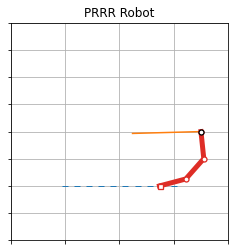

In [ ]:
xd = 3,2
q_sol,q_dot_sol = solve_1(xd)
animation_robot(q_sol)

/usr/local/lib/python3.6/dist-packages/IPython/core/pylabtools.py:125: MatplotlibDeprecationWarning: Support for uppercase single-letter colors is deprecated since Matplotlib 3.1 and will be removed in 3.3; please use lowercase instead.
  fig.canvas.print_figure(bytes_io, **kw)


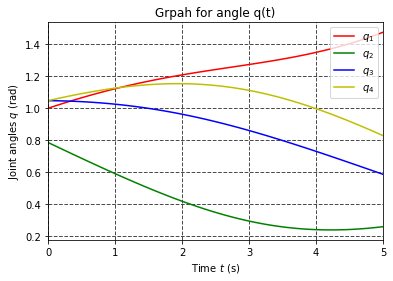

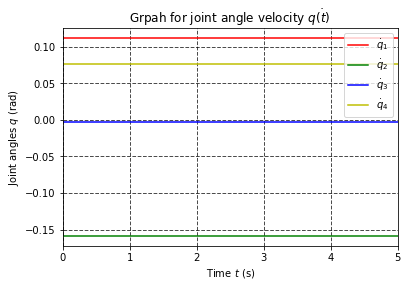

In [ ]:
plot_q(q_sol,q_dot_sol)

init pose : 0.4823619097949585 1.9318516525781366
desired pose : 0.48236193034167907 1.9318516554619727


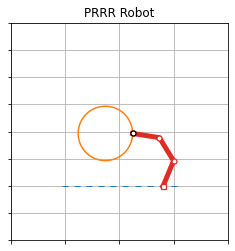

In [ ]:
q_sol_cir,q_dot_sol_cir = solve_1()
animation_robot(q_sol_cir)

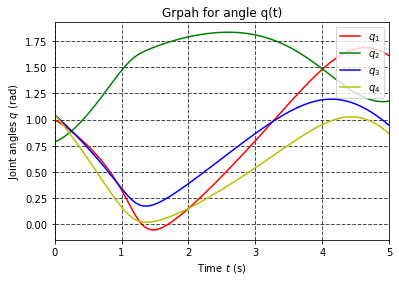

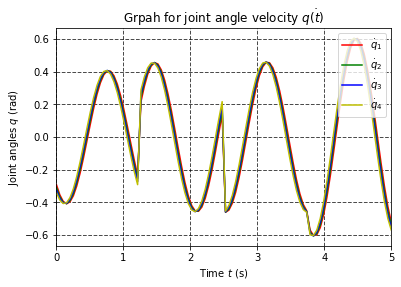

In [ ]:
plot_q(q_sol_cir,q_dot_sol_cir)

Problem2

Now, the robot are minimized a
configuration-dependent kinetics and potential energy function: 

\begin{equation}
 \underset{\dot{q}} {\text{min}}   \mathcal{J}_c = w_k\frac{1}{2}\dot{\mathbf{q}}^T \mathbf{D}(\mathbf{q})\dot{\mathbf{q}} + w_p\frac{\partial\mathbf{U}(\mathbf{q})}{\partial\mathbf{q}}^T\dot{\mathbf{q}}
\end{equation} 
A robot system might require more kinematics energies rather than the gravitational potential energy the gravitational potential energy or wise-versa. 



In [ ]:
def Gradien_U(q,l,m,g):
  q1,q2,q3,q4 = q[0],q[1],q[2],q[3]
  m1,m2,m3,m4 = m[0],m[1],m[2],m[3]
  l2,l3,l4 = l[1],l[2],l[3]
  return array([0,
       g*l2*m2*cos(q2)/2 + g*m3*(l2*cos(q2) + l3*cos(q2 + q3)/2) + g*m4*(l2*cos(q2) + l3*cos(q2 + q3) + l4*cos(q2 + q3 + q4)/2),
       g*l3*m3*cos(q2 + q3)/2 + g*m4*(l3*cos(q2 + q3) + l4*cos(q2 + q3 + q4)/2),
       g*l4*m4*cos(q2 + q3 + q4)/2])

def D_val1(q,m,l):
  q_1,q_2,q_3,q_4 = q[0],q[1],q[2],q[3]
  m_1,m_2,m_3,m_4 = m[0],m[1],m[2],m[3]
  l_1,l_2,l_3 = l[1],l[2],l[3]
  return array([[m_1 + m_2 + m_3 + m_4,
        -l_1*m_2*sin(q_2) + m_3*(-2*l_1*sin(q_2) - 2*l_2*sin(q_2 + q_3))/2 + m_4*(-2*l_1*sin(q_2) - 2*l_2*sin(q_2 + q_3) - 2*l_3*sin(q_2 + q_3 + q_4))/2,
        -l_2*m_3*sin(q_2 + q_3) + m_4*(-2*l_2*sin(q_2 + q_3) - 2*l_3*sin(q_2 + q_3 + q_4))/2,
        -l_3*m_4*sin(q_2 + q_3 + q_4)],
       [-l_1*m_2*sin(q_2) + m_3*(-2*l_1*sin(q_2) - 2*l_2*sin(q_2 + q_3))/2 + m_4*(-2*l_1*sin(q_2) - 2*l_2*sin(q_2 + q_3) - 2*l_3*sin(q_2 + q_3 + q_4))/2,
        m_2*(2*l_1**2*sin(q_2)**2 + 2*l_1**2*cos(q_2)**2)/2 + m_3*((-2*l_1*sin(q_2) - 2*l_2*sin(q_2 + q_3))*(-l_1*sin(q_2) - l_2*sin(q_2 + q_3)) + (l_1*cos(q_2) + l_2*cos(q_2 + q_3))*(2*l_1*cos(q_2) + 2*l_2*cos(q_2 + q_3)))/2 + m_4*((-2*l_1*sin(q_2) - 2*l_2*sin(q_2 + q_3) - 2*l_3*sin(q_2 + q_3 + q_4))*(-l_1*sin(q_2) - l_2*sin(q_2 + q_3) - l_3*sin(q_2 + q_3 + q_4)) + (l_1*cos(q_2) + l_2*cos(q_2 + q_3) + l_3*cos(q_2 + q_3 + q_4))*(2*l_1*cos(q_2) + 2*l_2*cos(q_2 + q_3) + 2*l_3*cos(q_2 + q_3 + q_4)))/2,
        m_3*(-l_2*(-2*l_1*sin(q_2) - 2*l_2*sin(q_2 + q_3))*sin(q_2 + q_3) + l_2*(2*l_1*cos(q_2) + 2*l_2*cos(q_2 + q_3))*cos(q_2 + q_3))/2 + m_4*((-l_2*sin(q_2 + q_3) - l_3*sin(q_2 + q_3 + q_4))*(-2*l_1*sin(q_2) - 2*l_2*sin(q_2 + q_3) - 2*l_3*sin(q_2 + q_3 + q_4)) + (l_2*cos(q_2 + q_3) + l_3*cos(q_2 + q_3 + q_4))*(2*l_1*cos(q_2) + 2*l_2*cos(q_2 + q_3) + 2*l_3*cos(q_2 + q_3 + q_4)))/2,
        m_4*(-l_3*(-2*l_1*sin(q_2) - 2*l_2*sin(q_2 + q_3) - 2*l_3*sin(q_2 + q_3 + q_4))*sin(q_2 + q_3 + q_4) + l_3*(2*l_1*cos(q_2) + 2*l_2*cos(q_2 + q_3) + 2*l_3*cos(q_2 + q_3 + q_4))*cos(q_2 + q_3 + q_4))/2],
       [-l_2*m_3*sin(q_2 + q_3) + m_4*(-2*l_2*sin(q_2 + q_3) - 2*l_3*sin(q_2 + q_3 + q_4))/2,
        m_3*(-2*l_2*(-l_1*sin(q_2) - l_2*sin(q_2 + q_3))*sin(q_2 + q_3) + 2*l_2*(l_1*cos(q_2) + l_2*cos(q_2 + q_3))*cos(q_2 + q_3))/2 + m_4*((-2*l_2*sin(q_2 + q_3) - 2*l_3*sin(q_2 + q_3 + q_4))*(-l_1*sin(q_2) - l_2*sin(q_2 + q_3) - l_3*sin(q_2 + q_3 + q_4)) + (2*l_2*cos(q_2 + q_3) + 2*l_3*cos(q_2 + q_3 + q_4))*(l_1*cos(q_2) + l_2*cos(q_2 + q_3) + l_3*cos(q_2 + q_3 + q_4)))/2,
        m_3*(2*l_2**2*sin(q_2 + q_3)**2 + 2*l_2**2*cos(q_2 + q_3)**2)/2 + m_4*((-2*l_2*sin(q_2 + q_3) - 2*l_3*sin(q_2 + q_3 + q_4))*(-l_2*sin(q_2 + q_3) - l_3*sin(q_2 + q_3 + q_4)) + (l_2*cos(q_2 + q_3) + l_3*cos(q_2 + q_3 + q_4))*(2*l_2*cos(q_2 + q_3) + 2*l_3*cos(q_2 + q_3 + q_4)))/2,
        m_4*(-l_3*(-2*l_2*sin(q_2 + q_3) - 2*l_3*sin(q_2 + q_3 + q_4))*sin(q_2 + q_3 + q_4) + l_3*(2*l_2*cos(q_2 + q_3) + 2*l_3*cos(q_2 + q_3 + q_4))*cos(q_2 + q_3 + q_4))/2],
       [-l_3*m_4*sin(q_2 + q_3 + q_4),
        m_4*(-2*l_3*(-l_1*sin(q_2) - l_2*sin(q_2 + q_3) - l_3*sin(q_2 + q_3 + q_4))*sin(q_2 + q_3 + q_4) + 2*l_3*(l_1*cos(q_2) + l_2*cos(q_2 + q_3) + l_3*cos(q_2 + q_3 + q_4))*cos(q_2 + q_3 + q_4))/2,
        m_4*(-2*l_3*(-l_2*sin(q_2 + q_3) - l_3*sin(q_2 + q_3 + q_4))*sin(q_2 + q_3 + q_4) + 2*l_3*(l_2*cos(q_2 + q_3) + l_3*cos(q_2 + q_3 + q_4))*cos(q_2 + q_3 + q_4))/2,
        m_4*(2*l_3**2*sin(q_2 + q_3 + q_4)**2 + 2*l_3**2*cos(q_2 + q_3 + q_4)**2)/2]])

def C_mat(w_p,u_grad):
  C=w_p*u_grad
  return C

def B_mat(j,wk,D):
  B=np.linalg.inv(j@np.linalg.inv(wk*D)@j.T)  
  return B

def G_mat(B,j,wk,D):
  G=np.linalg.inv(wk*D)@j.T@B
  return G

def q_dot(G,j,x_dot,wk,D,C):
  dq= G@x_dot +(np.identity(4)-G@j)@np.linalg.inv(wk*D)@C 
  return dq




def sol_q_analy(xd=None,w=(1,1)):

  def sysode_p2p(q_0, t, l,m,v):
      wk= 1
      wp= 1
      x_dot = v#-sin(t),cos(t)
      j = jac(q_0,l)
      u_grad = Gradien_U(q_0,l,m,g)#zeros(4)#
      D =  D_val1(q_0,l,m)
      C = C_mat(wp,u_grad)
      B = B_mat(j,wk,D)
      G = G_mat(B,j,wk,D)
      dq = q_dot(G,j,x_dot,wk,D,C)
      return dq

  def sysode(q_0, t, l,m):
      # wk= 1
      # wp= 1
      x_dot = -sin(t),cos(t)
      j = jac(q_0,l)
      u_grad = Gradien_U(q_0,l,m,g)#zeros(4)#
      D =  D_val1(q_0,l,m)
      C = C_mat(wp,u_grad)
      B = B_mat(j,wk,D)
      G = G_mat(B,j,wk,D)

      dq = q_dot(G,j,x_dot,wk,D,C)
      return dq


  global g,wk,wp
   
  wk,wp = w[0],w[1]
  # global
  g = 9.8
  m = 1,1,1,1
  l= 1,1,1,1
  q_0 = 1,pi/2,pi/3,pi/3

  x0 = fk(q_0,l)
  # xd = 1,2
  t0 = 0 # Initial time 
  tf = 2*pi# Final time
  N = 1E2 # Numbers of points in time span
  t = linspace(t0, tf, int(N)) # Create time span

  if xd == None:
    q_sol = odeint(sysode, q_0, t, args=(l,m))
    dq = array([sysode(q_0, t_i, l,m) for t_i in t])
  else:
    v = (xd-x0)/tf
    q_sol = odeint(sysode_p2p, q_0, t, args=(l,m,v))
    dq = array([sysode_p2p(q_0, t_i, l,m,v) for t_i in t])
  return q_sol,dq

The $w_k, w_p$ introduce are weighting gains to the energies function so that we can give different weighting to the cost function. 
In this experiment section we will try different values for the $\omega_k$ and $\omega_p$ and observed the effects. 

Let's considered
>**gains** $w_k  = 1, w_p=0$  

From the animation below, robot are moving has colision between links. 


init pose : -0.7320508075688775 1.000000000000001
desired pose : -0.7320508409003843 1.000000070293789


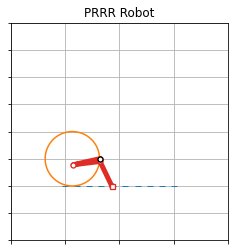

In [ ]:
q_sol_cir1,dq_cir1 = sol_q_analy(w=(1,0))
animation_robot(q_sol_cir1)

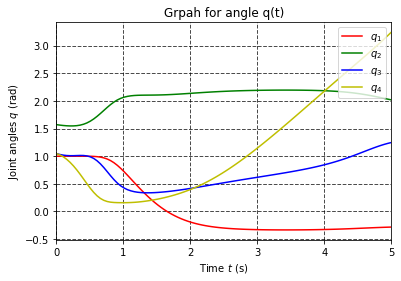

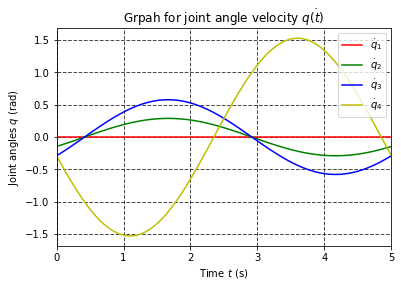

In [ ]:
plot_q(q_sol_cir1,dq_cir1)

Let's considered
>**gains** $w_k  = 1, w_p=1$  

From the animation below, robot are moving smoothly without colision. 

init pose : -0.7320508075688775 1.000000000000001
desired pose : -0.7320511080077592 1.0000003275558293


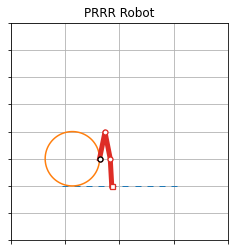

In [ ]:
q_sol_cir1,dq_cir1 = sol_q_analy(w=(1,1))
animation_robot(q_sol_cir1)

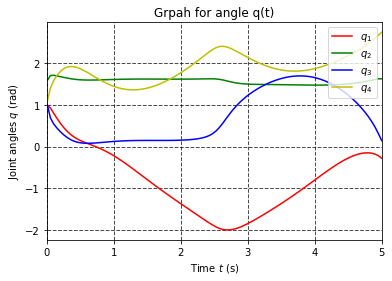

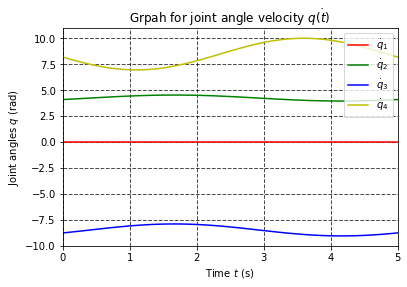

In [ ]:
plot_q(q_sol_cir1,dq_cir1)

>point to point 

init pose : -0.7320508075688775 1.000000000000001
desired pose : 0.9999999122930564 1.9999998966943917


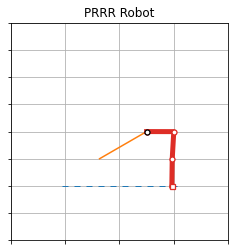

In [ ]:
xd = 1,2
q_sol_analy,dq_sol_analy = sol_q_analy(xd)
animation_robot(q_sol_analy)

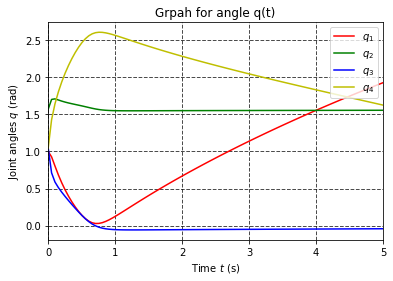

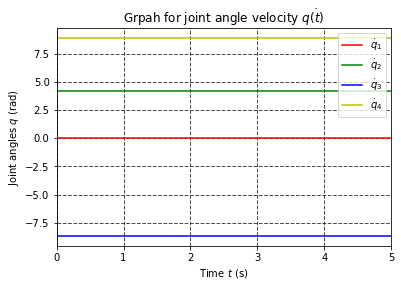

In [ ]:
plot_q(q_sol_analy,dq_sol_analy)

# Inequality constraints

In this case joint velocities are limited in a particular range, thus another constrain are added such that the joint velocities are bounded $\dot{\mathbf{q}}_{min}  \leq \dot{\mathbf{q}} \leq \dot{\mathbf{q}}_{max}$. Then, by associating this constrain to the task, the IK problem becomes:
\begin{equation}
\begin{aligned}
 \underset{\dot{q}} {\text{min}}   \mathcal{J}_c = w_k\frac{1}{2}\dot{\mathbf{q}}^T \mathbf{D}(\mathbf{q})\dot{\mathbf{q}} + w_p\frac{\partial\mathbf{U}(\mathbf{q})}{\partial\mathbf{q}}^T\dot{\mathbf{q}} 
  \end{aligned}\\
  \end{equation}
  \begin{equation}
 \begin{aligned}
 \\ S.T : &\quad  J(q) \dot{q} = \dot{x}
 \\ & \quad    \dot{\mathbf{q}}_{min}  \leq \dot{\mathbf{q}} \leq \dot{\mathbf{q}}_{max}
 \end{aligned}
\end{equation}

Let's define this optimization problem in a standard form of CVXOPT function as following :
\begin{equation}
    \underset{x} {\text{min}} \frac{1}{2} x^T P x + q^T x
\end{equation}
\begin{equation}
    Ax = b 
\end{equation}
\begin{equation}
    G(x)<=h
\end{equation}
Our problem with bounded constraint is given below become
\begin{equation}
  \dot{x} = J \dot{q}
\end{equation}
\begin{equation}
  \dot{q} < \dot{q_{max}}
\end{equation}
\begin{equation}
      \dot{q} < -\dot{q_{min}}
\end{equation}
by comparing our system with standard form of the CVXOPT the these constraint
P,Q,A,x,b,G,h has following values

$P = D , q^T = \nabla{U}^T , A = J , b = \dot{x} , x = \dot{q}$

G is a 8X4  matrix, which is the stack of two 4x4 identity matrix, where  x are equal to joint velocity with dimension  4X1, which makes it equal to 8X1 matrix with four maximum and four minimum values of $\dot{q}$.

\begin{equation}
 \begin{bmatrix}
  1&0&0&0\\0&1&0&0\\0&0&1&0\\0&0&0&1 \\ -1&0&0&0\\0&-1&0&0\\0&0&-1&0\\0&0&0&-1
 \end{bmatrix}\begin{bmatrix}
 \dot{q_1} \\ \dot{q_2} \\ \dot{q_3} \\ \dot{q_4}
 \end{bmatrix} = \begin{bmatrix}
 \dot{q_1}_{max}\\\dot{q_2}_{max}\\\dot{q_3}_{max}\\\dot{q_4}_{max} \\ -\dot{q_1}_{min} \\-\dot{q_2}_{min} \\-\dot{q_3}_{min} \\-\dot{q_4}_{min} 
 \end{bmatrix}
\end{equation}

In [ ]:
-identity(4)

array([[-1., -0., -0., -0.],
       [-0., -1., -0., -0.],
       [-0., -0., -1., -0.],
       [-0., -0., -0., -1.]])

In [ ]:
import cvxopt

def cvxopt_solve_qp(P, q, G=None, h=None, A=None, b=None):
    args = [cvxopt.matrix(P), cvxopt.matrix(q)]
    if G is not None:
        args.extend([cvxopt.matrix(G), cvxopt.matrix(h)])
        if A is not None:
            args.extend([cvxopt.matrix(A), cvxopt.matrix(b)])
    sol = cvxopt.solvers.qp(*args)
    if 'optimal' not in sol['status']:
        return None
    return array(sol['x']).reshape((P.shape[1],))

def q_dot_opt(q_0,l,m,x_dot,q_min,q_max):
  P = D_val1(q_0,m,l)
  q = Gradien_U(q_0,l,m,g)
  A = jac(q_0,l)
  b = x_dot
  h = np.hstack((q_max,-q_min))
  G = np.vstack((identity(4),-identity(4)))
  q_dot = cvxopt_solve_qp(P,q,G,h,A,b)
  return q_dot

def sysode_opt(q_0, t, l,m):

  x_dot =v#-sin(t),cos(t) #array([0.1,0.1])
  q_max = 5*np.array([0.1,0.1,0.1,0.1])
  q_min = 5*np.array([-0.1,-0.1,-0.1,-0.1])

  dq = q_dot_opt(q_0,l,m,x_dot,q_min,q_max)
  return dq

def sol_q_opt():
  global g,v 
  g = 9.8
  m = 1,1,1,1
  l= 0,1,1,1
  q_0 =2,pi/2,pi/3,pi/3

  x0 = fk(q_0,l)
  xd = 1,2

  t0 = 0 # Initial time 
  tf = 2 # Final time
  N = 1E2 # Numbers of points in time span
  t = linspace(t0, tf, int(N)) # Create time span
  v = (xd-x0)/tf

  q_sol = odeint(sysode_opt, q_0, t, args=(l,m))
  dq = array([sysode_opt(q_0, t_i, l,m) for t_i in t])

  return q_sol,dq


init pose : 0.2679491924311226 1.000000000000001
desired pose : 0.9999997910960584 2.000000307586757


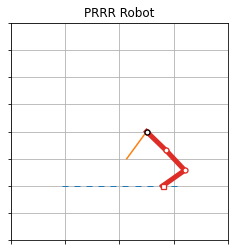

In [ ]:
q_sol_opt1,dq_opt1 = sol_q_opt()
from IPython.display import clear_output
clear_output()
animation_robot(q_sol_opt1)

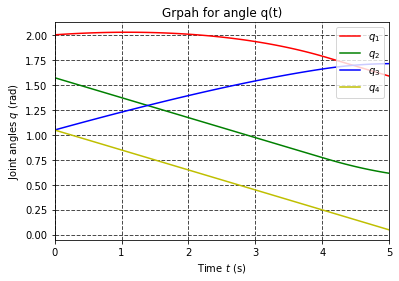

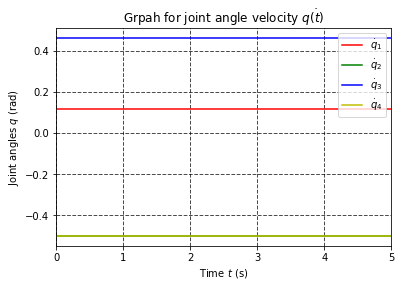

In [ ]:
plot_q(q_sol_opt1,dq_opt1)

By setting problem this way, it is possible for QP solver, such as CVXOPT or quadprog in Python. However the equality and inequality together could cause violate e.g. joint limits or KKT conditions which are simply unsolvable in some configurations. 
To avoid this problem, we can consider $J(q) \dot{q} = \dot{x}$  constrain as one of the cost function $ \mathcal{J}_c $   which defined as the squared norms. Then quadratic cost function and linear inequalities are defined as :
\begin{equation}
\begin{aligned}
   &\quad \underset{\dot{q}} {\text{min}}   \mathcal{J}_c = w_k\frac{1}{2}\dot{\mathbf{q}}^T \mathbf{D}(\mathbf{q})\dot{\mathbf{q}} + \|{J(q) \dot{q} - \dot{x}}\| ^2 _2 \\ 
  &\quad S.T :\quad \dot{\mathbf{q}}_{min}  \leq \dot{\mathbf{q}} \leq \dot{\mathbf{q}}_{max}
  \end{aligned}
\end{equation}
where
\begin{equation}
 \begin{aligned}
\|{J(q) \dot{q} - \dot{x}}\| ^2 _2 &\quad =  (J(q) \dot{q} - \dot{x})^T(J(q) \dot{q} - \dot{x})\\
&\quad= \dot{q}^T JJ^T \dot{q} -  \dot{x}^TJ\dot{q} - \dot{q} ^T J^T \dot{x}+\dot{x}^T\dot{x}\\
&\quad= 1/2 \dot{q}^T JJ^T \dot{q}-1/2  \dot{x}^TJ\dot{q} - \dot{q} ^T J^T \dot{x}\\
&\quad= 1/2 \dot{q}^T JJ^T \dot{q}- \dot{x}^TJ\dot{q} 
 \end{aligned}
\end{equation}



# integration drift
 Let 
 
 \begin{equation}
 e = x_d - x \\
 \dot{e} = \dot{x_d} - \dot{x}\\
 \dot{e} + K e = 0
 \end{equation} By introducing K a positive definite (usually diagonal) matrix, the system will be
asymptotically stable. The error tends to zero along the trajectory with a convergence rate that depends on the eigenvalues of matrix K. 

Then substitute $\dot{x} = \dot{x_d} +k e$ to norm cost above:
 \begin{equation}
 \|\dot{x_d} +k e-J(q) \dot{q}\|^2 _2   
 \end{equation}
Therefore the quadratic cost function and linear inequalities are defined as: 
\begin{equation}
\begin{aligned}
&\quad \underset{\dot{q}} {\text{min}}   \mathcal{J}_c = w_k\frac{1}{2}\dot{\mathbf{q}}^T (\mathbf{D}+J^TJ)\dot{\mathbf{q}} + w_p(\frac{\partial\mathbf{U}(\mathbf{q})}{\partial\mathbf{q}}^T - \dot{x_d} +k e )\dot{\mathbf{q}} \\
   &\quad S.T :\quad \dot{\mathbf{q}}_{min}  \leq \dot{\mathbf{q}} \leq \dot{\mathbf{q}}_{max}
  \end{aligned}
  \end{equation}

In [ ]:

def sol_opt_v2(xd):

  def q_dot_opt2(q_0,l,m,x_dot,q_min,q_max):
    wp,wk,k = 1,1,1
    J = jac(q_0,l)
    P = D_val1(q_0,m,l)+J.T@J
    q = -k*(x_dot.T@J) #+  Gradien_U(q_0,l,m,g)
    h = np.hstack((q_max,-q_min))
    G = np.vstack((identity(4),-identity(4)))
    q_dot = cvxopt_solve_qp(P,q,G,h)
    return q_dot

  def sysode_opt2(q_0, t,xd,xb, l,m):
    
    x0 = fk(q_0,l)
    k =10# np.diag([10,10])
    vd =(xd-x0)/tf 
    x_dot = vd+k*(xd-x0)
    q_max = 5*np.array([1.0,1.0,1.0,1.0])
    q_min = 5*np.array([-1.0,-1.0,-1.0,-1.0])

    dq = q_dot_opt2(q_0,l,m,x_dot,q_min,q_max)
    return dq


  global g ,tf,l
  g = 9.8
  m = 1,1,1,1
  l= 1,1,1,1
  q_0 =2,pi/2,pi/3,pi/3

  xb = array([1,2])


  t0 = 0 # Initial time 
  tf = 3# Final time
  N = 1E2 # Numbers of points in time span
  t = linspace(t0, tf, int(N)) # Create time span

  q_sol = odeint(sysode_opt2, q_0, t, args=(xd,xb,l,m))

  dq = array([sysode_opt2(q_0, t,xd,xb, l,m) for t_i in t])

  return q_sol,dq


init pose : 0.2679491924311226 1.000000000000001
desired pose : 1.9999097809959145 2.0000294777546905


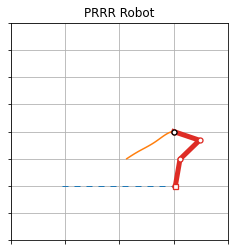

In [ ]:
xd = array([2,2])
q_sol_opt2,dq_opt2 = sol_opt_v2(xd)
clear_output()
animation_robot(q_sol_opt2)

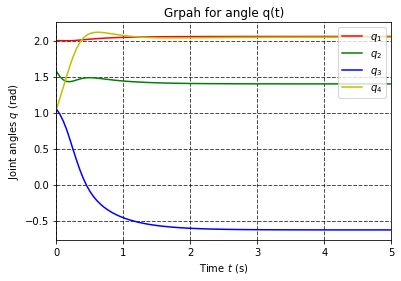

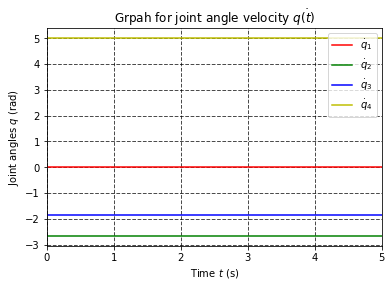

In [ ]:
plot_q(q_sol_opt2,dq_opt2 )

**Bonus:**

The total configuration space force acting on the robot is the sum of the
configuration space forces that result from all attractive and repulsive control
points
\begin{equation}
 \begin{aligned}
F(q) &\quad =  \sum{\tau_{att_{i}}(q)}+\sum{\tau_{rep_{i}}(q)}\\
&\quad= \sum{J^T_i(q)F_{att_{i}}(q)}+\sum{J^T_i(q)F_{rep_{i}}(q)}\\
 \end{aligned}
\end{equation}


In [ ]:
def get_distance(q_i, xb):
  diff_x =  fk(q_i,l) -xb 
  distance = np.hypot(diff_x[0], diff_x[1])
  return distance,diff_x

def potential_fiel(q_i, xb,tol,k=1):
  dist,diff = get_distance(q_i,xb)
  F = k*((1/dist - 1/tol)/dist**2 )*(diff/dist)
  return F

In [ ]:
def sol_opt_rep_field(xd):

  def q_dot_opt2(q_0,l,m,x_dot,q_min,q_max,field):
    wp,wk,k = 1,1,1
    J = jac(q_0,l)
    P = D_val1(q_0,m,l)+J.T@J
    q = -k*(x_dot.T@J)#+field.T
    h = np.hstack((q_max,-q_min))
    G = np.vstack((identity(4),-identity(4)))
    q_dot = cvxopt_solve_qp(P,q,G,h)
    return q_dot

  def sysode_opt2(q_0, t,xd,xb, l,m):
    
    x0 = fk(q_0,l)
    k = 5
    # vd =(xd-x0)/tf #xd-x0)/tf
    v_att = k*(xd-x0)
    v_rep = (x0-xb)/np.linalg.norm(x0-xb)
    field = potential_fiel(q_0, xb,1.4,k=1)
    x_dot = v_att+field
    q_max = np.array([1.0,1.0,1.0,1.0])
    q_min = np.array([-1.0,-1.0,-1.0,-1.0])


    dq = q_dot_opt2(q_0,l,m,x_dot,q_min,q_max,field)
    return dq


  global g ,tf,l,xb
  g = 9.8
  m = 1,1,1,1
  l= 1,1,1,1
  q_0 =2,pi/2,pi/3,pi/3

  t0 = 0 # Initial time 
  tf = 3# Final time
  N = 1E2 # Numbers of points in time span
  t = linspace(t0, tf, int(N)) # Create time span

  q_sol = odeint(sysode_opt2, q_0, t, args=(xd,xb,l,m))

  dq = array([sysode_opt2(q_0, t,xd,xb, l,m) for t_i in t])

  return q_sol,dq


init pose : 0.2679491924311226 1.000000000000001
desired pose : 2.0249074520841743 2.5049800306415824


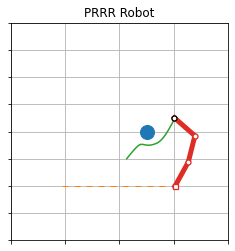

In [ ]:
xd = array([2,2.5])
xb = array([1,2])
q_sol_opt2,dq_opt2 = sol_opt_rep_field(xd)
clear_output()
animation_robot(q_sol_opt2,xb=xb.reshape(1,2))

With more obstracles and provided potential field at each link 

In [ ]:
def fk1(q, l):
  x = zeros(2)
  for i in range(shape(q)[0]):
    if i ==0:
      x = array([q[0],0])
    else:
      x += l[i]*array([cos(sum(q[1:i+1])),sin(sum(q[1:i+1]))])
  return x 

def get_distance1(q_i, xb):
  diff_x =  fk1(q_i,l) -xb 
  distance = np.hypot(diff_x[0], diff_x[1])
  return distance,diff_x

def get_nearest_distance(q_i,obs):
  
  dist = zeros(obs.shape[0])
  diff = zeros((obs.shape[0],2))
  for i in range(obs.shape[0]):
    dist[i],diff[i] = get_distance1(q_i, obs[i])
  nearest = np.argmin(dist)
  return dist[nearest],diff[nearest]

def potential_fiel(q_i, xb,tol,k=1):
  dist,diff = get_nearest_distance(q_i,xb)
  F = k*((1/dist - 1/tol)/dist**2 )*(diff/dist)
  return F

def repulse_field(q_0,l):
  J = jac(q_0,l)
  F = zeros((q_0.shape[0],4))
  for i in range(q_0.shape[0]):
    F[i,:i+1] = potential_fiel(q_0[:i+1], xb,1.5,k=1)@J[:,:i+1]
  return sum(F,axis=0)

In [ ]:
def sol_opt_rep_field2(xd):

  def q_dot_opt2(q_0,l,m,x_dot,q_min,q_max):

    wp,wk,k = 1,1,1
    J = jac(q_0,l)
    
    rep_field  = repulse_field(q_0,l)
    att_field = k*(x_dot.T@J)
    field = att_field+rep_field


    P = D_val1(q_0,m,l)+J.T@J
    q = -field.reshape(4,1)#+field.T
    h = np.hstack((q_max,-q_min))
    G = np.vstack((identity(4),identity(4)))
    q_dot = cvxopt_solve_qp(P,q,G,h)
    return q_dot

  def sysode_opt2(q_0, t,xd,xb, l,m):
    
    x0 = fk(q_0,l)
    k = 5

    dist,_ = get_distance(q_0,xb)
    tor = 1.4

    x_dot = k*(xd-x0)#+field
    q_max = 10*np.array([1.0,1.0,1.0,1.0])
    q_min = 10*np.array([-1.0,-1.0,-1.0,-1.0])

    dq = q_dot_opt2(q_0,l,m,x_dot,q_min,q_max)
    return dq


  global g ,tf,l,xb
  g = 9.8
  m = 1,1,1,1
  l= 1,1,1,1
  q_0 =array([2,pi/2,pi/3,pi/3])

  # xb = array([1,2])


  t0 = 0 # Initial time 
  tf = 3# Final time
  N = 1E2 # Numbers of points in time span
  t = linspace(t0, tf, int(N)) # Create time span

  q_sol = odeint(sysode_opt2, q_0, t, args=(xd,xb,l,m))

  dq = array([sysode_opt2(q_0, t,xd,xb, l,m) for t_i in t])

  return q_sol,dq


init pose : 0.2679491924311226 1.000000000000001
desired pose : 2.838076502715112 2.495969066554776


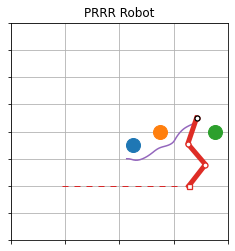

In [ ]:
xd = array([3,2.5])
xb = array([[0.5,1.5],[1.5,2],[3.5,2]])
q_sol_opt2,dq_opt2 = sol_opt_rep_field2(xd)
clear_output()
animation_robot(q_sol_opt2,xb=xb)